In [1]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib, os
matplotlib.use('Agg')
%matplotlib inline
from rfh_subsampling_analysis import *
import pandas as pd
import seaborn as sns
pd.set_option('precision', 4)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
            
model_directory = '../../../../rfh_subsampling_eval/'
class_dirs = [model_directory+'/{}/'.format(d) for d in os.listdir(model_directory) if os.path.isdir(model_directory+'/{}/'.format(d))]
k = 40
rename_run_dirs(class_dirs)

In [2]:
gather_df = gather_dir_metrics(model_directory, k, labels=['PriA-SSB AS'])
col_indices = list(range(6)) + list(range(9, 12)) + list(range(15, 63)) + list(range(87, 110))
col_indices = [i for i in col_indices if 'Mean' not in gather_df.columns[i] and 'Median' not in gather_df.columns[i]]
col_indices = [i for i in col_indices if 'PriA-SSB AS' in gather_df.columns[i]]
gather_df.columns = [col.replace('PriA-SSB AS', 'PriA-SSB prospective') for col in gather_df.columns]
metric_names = list(gather_df.columns.values[col_indices])
gather_df = gather_df[metric_names]
gather_df = gather_df.dropna(axis=0)
gather_df = gather_df.xs('test_metrics', level='set')
gather_df = gather_df.drop('Folds Mean', level='fold')
gather_df = gather_df.drop('Folds Median', level='fold')   
# redefine model name indices as integers for easy sorting by increasing training set size
gather_df.index = gather_df.index.set_levels([int(x) for x in gather_df.index.levels[0].str.replace('n_', '')], level=0)
gather_df.index = gather_df.index.set_levels([f[:-1]+'0'+f[-1] if len(f) == 6 else f for f in gather_df.index.levels[1]], level=1)
gather_df = gather_df.sortlevel(level=0)
gather_df.index = gather_df.index = gather_df.index.set_levels([f.replace('fold', 'run') for f in gather_df.index.levels[1]], level=1)
gather_df.index.names = ['train_size', 'run']

---
# top250 Box Plots

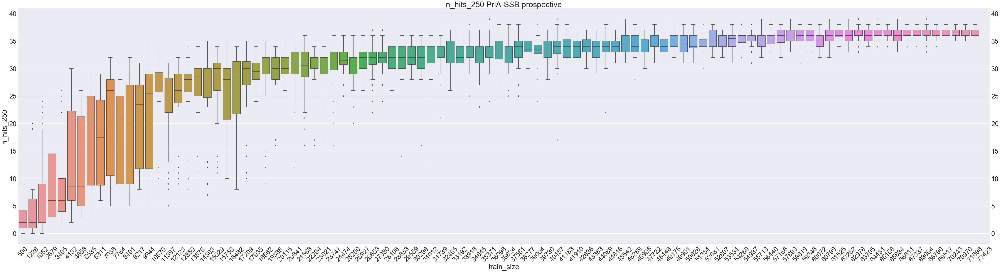

In [3]:
x = []
for n in gather_df.index.levels[0]:
    x.extend([n for _ in range(gather_df.loc[n].shape[0])])
col = 'n_hits_250 PriA-SSB prospective'
plt.figure(figsize=(80,20))
sns.set(font_scale=3)
ax = sns.boxplot(x=x, y=gather_df[col].as_matrix())
plt.xlabel('train_size'), plt.ylabel(col.replace(' PriA-SSB prospective', '')), plt.title(col);
plt.tick_params(axis='y', which='both', labelleft='on', labelright='on');
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show();

---
# top250 train_indices overlap for best runs 

In [4]:
# load training data
file_list = ['../../../dataset/fixed_dataset/fold_5/file_{}.csv'.format(i) for i in range(5)]
train_pd = read_merged_data(file_list)
test_pd = pd.read_csv('../../../dataset/pria_prospective.csv.gz', compression='gzip')

y_train = train_pd['Keck_Pria_AS_Retest'].as_matrix()
y_test = test_pd['Keck_Pria_AS_Retest'].as_matrix()

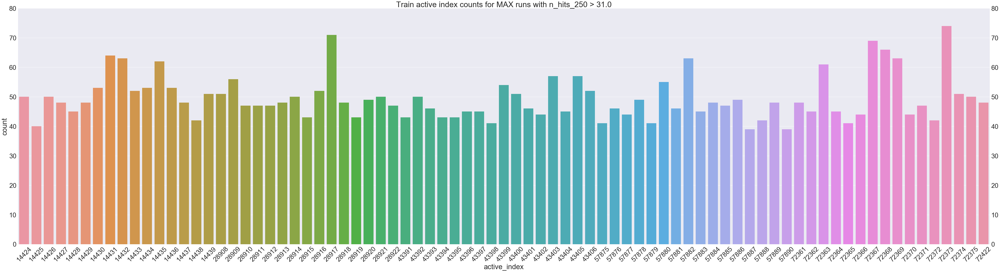

In [5]:
# MAX runs
max_train_actives_count_dict = get_active_count_dict(model_directory=model_directory, y_train=y_train,
                                                     gather_df=gather_df, column='n_hits_250 PriA-SSB prospective', 
                                                     idxfunc='idxmax', 
                                                     col_threshold_func=(lambda x: x > 31.0))
# plot histogram of the max run train active index counts
x = []
y = []
for tsize in max_train_actives_count_dict:
    x.append(tsize)
    y.append(max_train_actives_count_dict[tsize])
plt.figure(figsize=(80,20))
sns.set(font_scale=3)
ax = sns.barplot(x, y)
plt.xlabel('active_index'), plt.ylabel('count'), plt.title('Train active index counts for MAX runs with n_hits_250 > 31.0');
plt.tick_params(axis='y', which='both', labelleft='on', labelright='on'); plt.ylim([0, 80]);
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show();

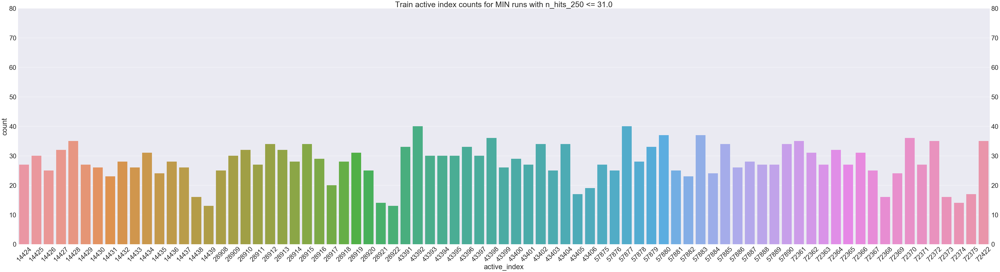

In [6]:
# MIN runs
min_train_actives_count_dict = get_active_count_dict(model_directory=model_directory, y_train=y_train,
                                                     gather_df=gather_df, column='n_hits_250 PriA-SSB prospective', 
                                                     idxfunc='idxmin',
                                                     col_threshold_func=(lambda x: x <= 31.0))
# plot histogram of the min run train active index counts
x = []
y = []
for tsize in min_train_actives_count_dict:
    x.append(tsize)
    y.append(min_train_actives_count_dict[tsize])
plt.figure(figsize=(80,20))
sns.set(font_scale=3)
ax = sns.barplot(x, y)
plt.xlabel('active_index'), plt.ylabel('count'), plt.title('Train active index counts for MIN runs with n_hits_250 <= 31.0');
plt.tick_params(axis='y', which='both', labelleft='on', labelright='on'); plt.ylim([0, 80]);
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show();

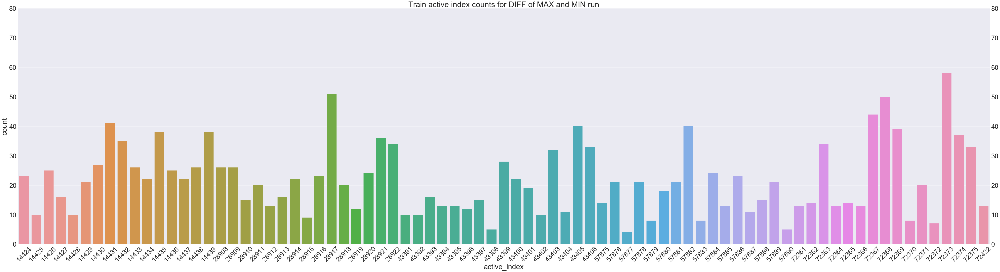

In [7]:
# take difference of these MAX-MIN
diff_train_active_counts = {}
for tsize in max_train_actives_count_dict:
    diff_train_active_counts[tsize] = max(max_train_actives_count_dict[tsize] - min_train_actives_count_dict[tsize], 0)
x = []
y = []
for tsize in diff_train_active_counts:
    x.append(tsize)
    y.append(diff_train_active_counts[tsize])
plt.figure(figsize=(80,20))
sns.set(font_scale=3)
ax = sns.barplot(x, y)
plt.xlabel('active_index'), plt.ylabel('count'), plt.title('Train active index counts for DIFF of MAX and MIN run');
plt.tick_params(axis='y', which='both', labelleft='on', labelright='on'); plt.ylim([0, 80]);
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show();

The idea with difference boxplot is to highlight which train actives are important.

Train actives that appeared many times in the MAX run and few in the MIN run, will still have a high count in the DIFF histogram. Their presence increased the n_hits. 

Whereas train actives that appeared similar number of times in the MAX and MIN runs will have a low count in the DIFF histogram. Their presence did not affect the n_hits by much.

This is just one way I thought of analyzing the importance. We can also play with the threshold of which runs to check for MAX and MIN run. Currently, MAX run are set to those with only greater than basline performance 31.0; MIN run are set to those with <= 31.0.

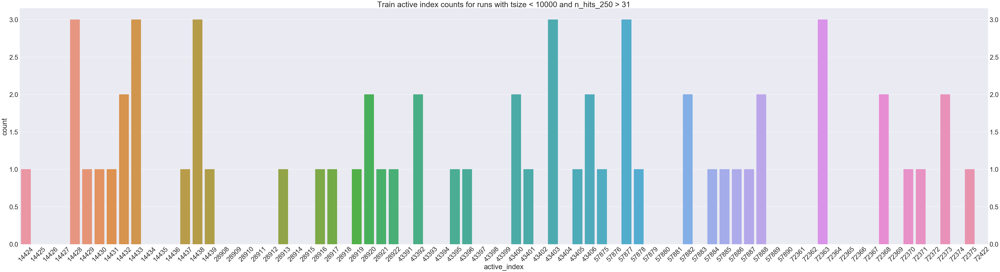

In [8]:
tsize_threshold, col_threshold = 10000, 31
train_actives_count_dict = get_active_count_dict_with_tsize_thresh(model_directory=model_directory, y_train=y_train,
                                                                   gather_df=gather_df, column='n_hits_250 PriA-SSB prospective', 
                                                                   col_threshold_func=(lambda x: x > col_threshold), 
                                                                   tsize_threshold_func=(lambda train_size: train_size < tsize_threshold))
# plot histogram of the min run train active index counts
x = []
y = []
for tsize in train_actives_count_dict:
    x.append(tsize)
    y.append(train_actives_count_dict[tsize])
plt.figure(figsize=(80,20))
sns.set(font_scale=3)
ax = sns.barplot(x, y)
plt.xlabel('active_index'), plt.ylabel('count');
plt.title('Train active index counts for runs with tsize < {} and n_hits_250 > {}'.format(tsize_threshold, col_threshold));
plt.tick_params(axis='y', which='both', labelleft='on', labelright='on'); 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show();

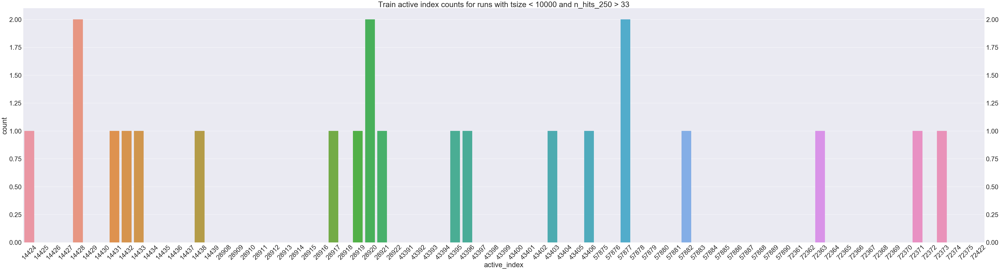

In [9]:
tsize_threshold, col_threshold = 10000, 33
train_actives_count_dict = get_active_count_dict_with_tsize_thresh(model_directory=model_directory, y_train=y_train,
                                                                   gather_df=gather_df, column='n_hits_250 PriA-SSB prospective', 
                                                                   col_threshold_func=(lambda x: x > col_threshold), 
                                                                   tsize_threshold_func=(lambda train_size: train_size < tsize_threshold))
# plot histogram of the min run train active index counts
x = []
y = []
for tsize in train_actives_count_dict:
    x.append(tsize)
    y.append(train_actives_count_dict[tsize])
plt.figure(figsize=(80,20))
sns.set(font_scale=3)
ax = sns.barplot(x, y)
plt.xlabel('active_index'), plt.ylabel('count');
plt.title('Train active index counts for runs with tsize < {} and n_hits_250 > {}'.format(tsize_threshold, col_threshold));
plt.tick_params(axis='y', which='both', labelleft='on', labelright='on'); 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
plt.show();

Here I wanted to see train active counts for runs where the training size was less than some threshold and the n_hits_250 was greater than some threshold. 

This would show us which train actives helped in boosting n_hits_250 when we have few training data. 

We can see from the boxplot some of the train actives are missing completely and still we get good performance.

---
# Metric Results

In [10]:
gather_df

ROC AUC PriA-SSB prospective  BEDROC AUC PriA-SSB prospective  PR auc.integral PriA-SSB prospective  NEF_0.1 % PriA-SSB prospective  NEF_0.15 % PriA-SSB prospective  NEF_0.5 % PriA-SSB prospective  NEF_1 % PriA-SSB prospective  NEF_2 % PriA-SSB prospective  NEF_5 % PriA-SSB prospective  NEF_10 % PriA-SSB prospective  NEF_20 % PriA-SSB prospective  EF_0.1 % PriA-SSB prospective  EF_0.15 % PriA-SSB prospective  EF_0.5 % PriA-SSB prospective  EF_1 % PriA-SSB prospective  EF_2 % PriA-SSB prospective  EF_5 % PriA-SSB prospective  EF_10 % PriA-SSB prospective  EF_20 % PriA-SSB prospective  NEF AUC PriA-SSB prospective  n_hits_100 PriA-SSB prospective  n_hits_250 PriA-SSB prospective  n_hits_500 PriA-SSB prospective  n_hits_1000 PriA-SSB prospective  n_hits_2500 PriA-SSB prospective  n_hits_5000 PriA-SSB prospective  n_hits_10000 PriA-SSB prospective
train_size run                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            
500        run 00                        0.5346                           0.0901                                0.0041                          0.0455                           0.0303                          0.0185                        0.0185                        0.0185                        0.0185                         0.0926                         0.2037                        18.5185                         12.3457                         3.7037                       1.8519                       0.9259                       0.3704                        0.9259                        1.0185                        0.0927                              1.0                              1.0                              1.0                               1.0                               5.0                              11.0                               25.0
           run 01                        0.5959                           0.1497                                0.0409                          0.1818                           0.1212                          0.0926                        0.0926                        0.0926                        0.0926                         0.1296                         0.2222                        74.0741                         49.3827                        18.5185                       9.2593                       4.6296                       1.8519                        1.2963                        1.1111                        0.1388                              5.0                              5.0                              5.0                               5.0                               8.0                              12.0                               33.0
           run 02                        0.7275                           0.2806                                0.0333                          0.1364                           0.0909                          0.1111                        0.1111                        0.1111                        0.2222                         0.3333                         0.4630                        55.5556                         37.0370                        22.2222                      11.1111                       5.5556

---
# Metric Box Plots

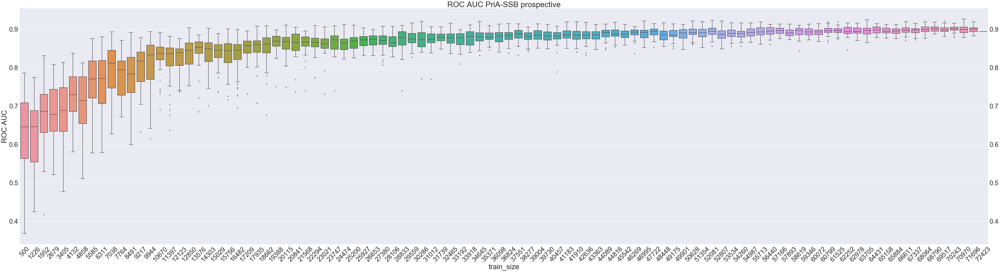

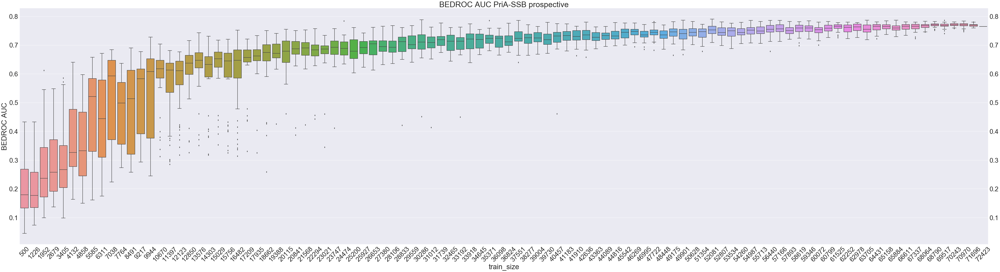

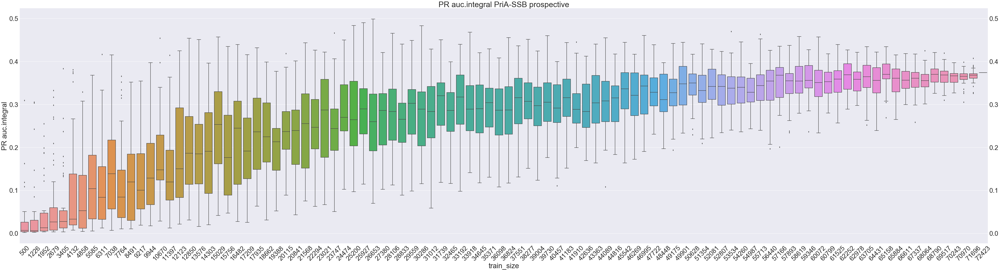

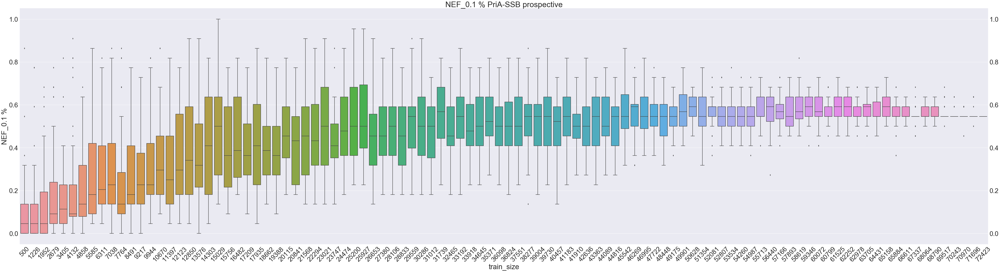

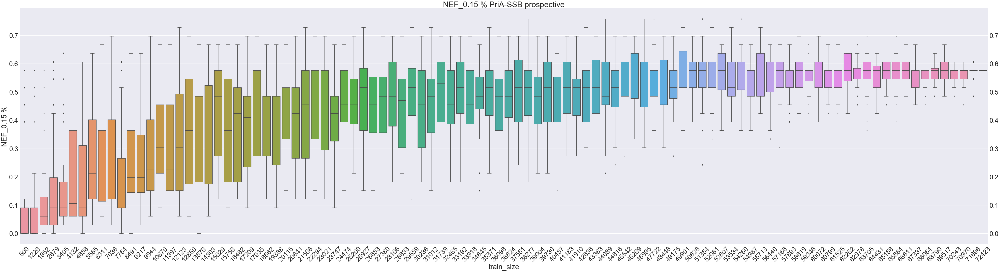

...

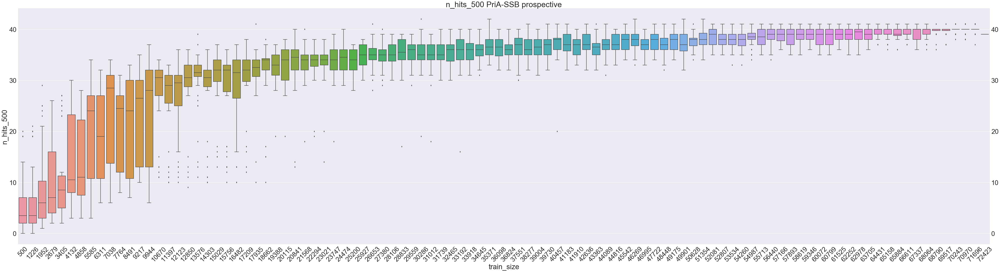

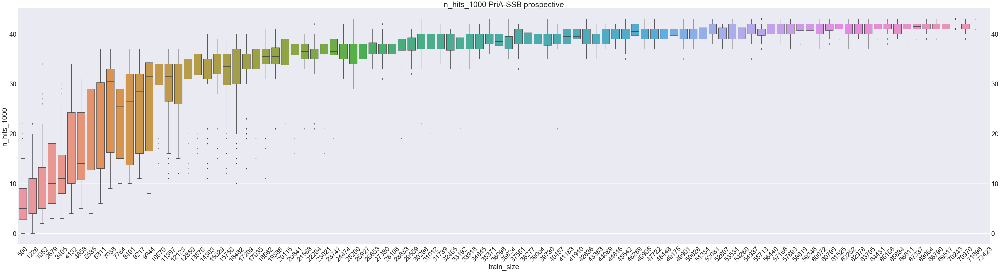

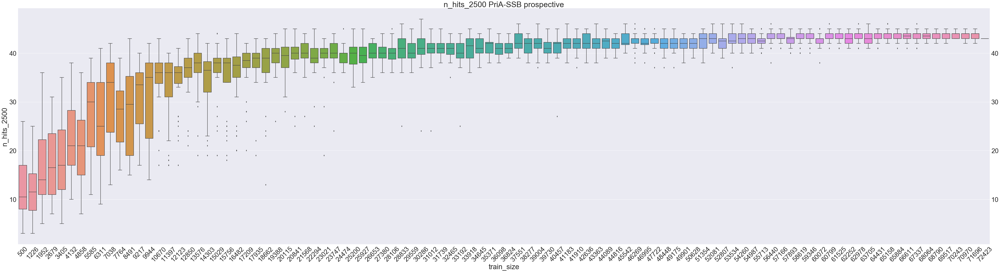

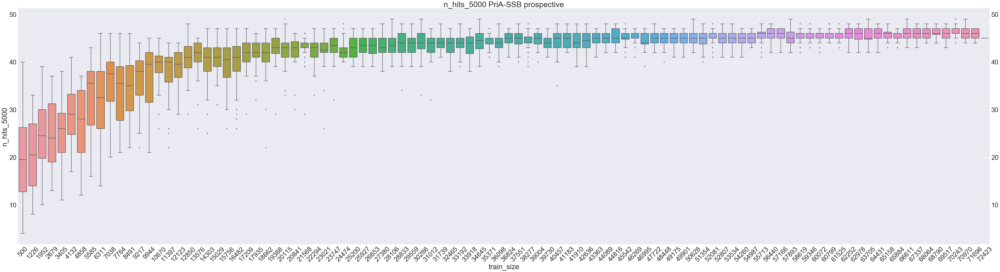

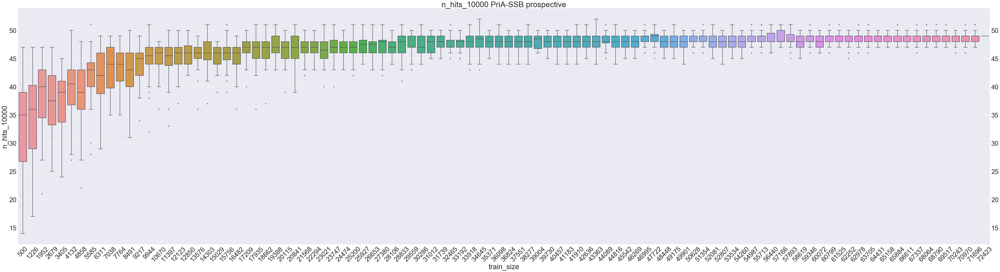

In [11]:
x = []
for n in gather_df.index.levels[0]:
    x.extend([n for _ in range(gather_df.loc[n].shape[0])])
for col in gather_df.columns:
    plt.figure(figsize=(80,20))
    sns.set(font_scale=3)
    ax = sns.boxplot(x=x, y=gather_df[col].as_matrix())
    plt.xlabel('train_size'), plt.ylabel(col.replace(' PriA-SSB prospective', '')), plt.title(col);
    plt.tick_params(axis='y', which='both', labelleft='on', labelright='on');
    ax.set_xticklabels(ax.get_xticklabels(),rotation=45);
    plt.show();